## Importing Libraries

In [4]:
# pip install -r requirements.txt


In [2]:
import pandas as pd
import numpy as np
import pickle
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.api import VAR, VARMAX
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.statespace.structural import UnobservedComponents
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from statsmodels.tsa.arima.model import ARIMA
import plotly.graph_objs as go
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import datetime
import warnings
warnings.filterwarnings("ignore")

C:\Users\99416\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


ModuleNotFoundError: No module named 'tensorflow.python.data.experimental.ops.iterator_model_ops'

## Reading Dataset

In [ ]:
df1 = pd.read_csv('Grocery_Prices_new_till_feb24.csv')
df2 = pd.read_csv('September_2024.csv')

# Append the two DataFrames
df = pd.concat([df1, df2], ignore_index=True)

# Check the combined DataFrame
df

# # Optionally, save the combined DataFrame to a new CSV file
# combined_df.to_csv('Combined_Grocery_Prices.csv', index=False)

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d').apply(lambda x: x.replace(day=1))

In [ ]:
# all_months = pd.date_range(start='2006-06', end='2023-02', freq='MS')  # MS is for Month Start

# # Function to check for missing months
# def check_missing_months(df, all_months):
#     food_items = df['Series_title_1'].unique()  # List of unique food items
#     missing_data = {}

#     for food in food_items:
#         # Filter the data for the current food item
#         food_data = df[df['Series_title_1'] == food]

#         # Extract the months available for this food item
#         available_months = food_data['Date'].sort_values().unique()

#         # Check for missing months
#         missing_months = [month for month in all_months if month not in available_months]
        

#         if missing_months:
#             missing_data[food] = missing_months
    
#     return missing_data
# x=0
# # Check for missing months for each food item
# missing_data = check_missing_months(df, all_months)

# if missing_data:
#     for food, months in missing_data.items():
#         print(f"Food item: {food} is missing data for {len(months)}.")
#         x+=1
# #         print("Missing months:", months)
# else:
#     print("All food items have data for all months from 2006 to 2023.")
# print(x)



all_months = pd.date_range(start='2006-06', end='2024-09', freq='MS')  # Adjust the end date to your requirement

# Function to check for missing months
def check_missing_months(df, all_months):
    food_items = df['Series_title_1'].unique()  # List of unique food items
    missing_data = {}

    for food in food_items:
        # Filter the data for the current food item
        food_data = df[df['Series_title_1'] == food]

        # Extract the months available for this food item
        available_months = food_data['Date'].sort_values().unique()

        # Check for missing months
        missing_months = [month for month in all_months if month not in available_months]

        # Store the food item and the count of missing months if greater than 0
        if missing_months:
            missing_data[food] = len(missing_months)  # Store the count of missing months

    return missing_data

# Check for missing months for each food item
missing_data = check_missing_months(df, all_months)

# Identify food items to remove (those with more than 50 months missing)
items_to_remove = {food for food, months in missing_data.items() if months > 50}

# Remove the food items from the original DataFrame
filtered_df = df[~df['Series_title_1'].isin(items_to_remove)]

# Optional: Print the number of rows before and after filtering
print(f"Original DataFrame rows: {len(df)}")
print(f"Filtered DataFrame rows: {len(filtered_df)}")


In [ ]:
df=0
df = filtered_df
df

In [ ]:
# Ensure uniqueness by averaging duplicates (or you can choose another method)
df = df.groupby(['Date', 'Series_title_1'], as_index=False)['Data_value'].mean()

# Pivot the dataset to have food items as columns and dates as index
pivot_df = df.pivot(index='Date', columns='Series_title_1', values='Data_value')
pivot_df

## Filling Null Values

In [ ]:
pivot_df = pivot_df.fillna(method='ffill').fillna(method='bfill')
pivot_df

## Check Null and Duplicated Values

In [ ]:
# Check for duplicates
print(pivot_df.index.duplicated().sum())

# Check for missing values
print(pivot_df.isnull().sum().sum())

## Splitting Data

In [ ]:
# Split the dataset into training and testing sets
# n_obs = int(0.8 * len(pivot_df))
train = pivot_df[:-24]
test = pivot_df[-24:]

## Vector AutoRegressive (VAR) 

In [10]:
# Set a fixed number of lags
fixed_lags = 2

# Fit the VAR model on the training data
model = VAR(train)
model_fit = model.fit(fixed_lags)
with open('var_test_model.pkl', 'wb') as file:
    pickle.dump(model_fit, file)
# Forecast future values for the test period
n_forecast = len(test)
forecast = model_fit.forecast(y=train.values, steps=n_forecast)

var_pred = forecast
# Convert forecast to DataFrame for easier handling
forecast_df = pd.DataFrame(forecast, index=test.index, columns=test.columns)

# Calculate MAE and MSE for VAR
var_error_metrics = {}
for column in pivot_df.columns:
    mae = mean_absolute_error(test[column], forecast_df[column])
    mse = mean_squared_error(test[column], forecast_df[column])
    var_error_metrics[column] = {'MAE': mae, 'MSE': mse}

# Combine error metrics into a single DataFrame
var_metrics_df = pd.DataFrame(var_error_metrics).T
var_metrics_df['Model'] = 'VAR'

# Rearrange the columns
var_metrics_df = var_metrics_df[['Model', 'MAE', 'MSE']]

print(var_metrics_df)

# Retrain the VAR model on the entire dataset
model_full = VAR(pivot_df)
model_full_fit = model_full.fit(fixed_lags)

# Forecast future values for the next 12 months after the test period
future_forecast = model_full_fit.forecast(y=pivot_df.values, steps=12)

# Ensure the index is in datetime format
test.index = pd.to_datetime(test.index)

# Create future forecast DataFrame
future_forecast_dates = pd.date_range(start=test.index[-1] + pd.DateOffset(1), periods=12, freq='MS')
future_forecast_df = pd.DataFrame(future_forecast, index=future_forecast_dates, columns=pivot_df.columns)

with open('var_future_model.pkl', 'wb') as file:
    pickle.dump(model_full_fit, file)

                                                   Model       MAE         MSE
Apples, 1kg                                          VAR  0.712132    0.851149
Avocado, 1kg                                         VAR  7.129476   85.961409
Baby food, 110g                                      VAR  0.265845    0.097443
Bananas, 1kg                                         VAR  0.391675    0.237149
Beans, 1kg                                           VAR  9.177280  115.783327
...                                                  ...       ...         ...
Two minute noodles, multipack,5                      VAR  0.868763    1.221397
Vinegar, 750ml                                       VAR  0.157432    0.041913
Wheatmeal bread, sliced, 700g                        VAR  0.398092    0.195425
Wholegrain bread, sliced, 700g                       VAR  0.232333    0.074521
Yoghurt - flavoured, 150g pottle (supermarket o...   VAR  0.529988    0.395461

[136 rows x 3 columns]


## Plot

In [11]:
# Convert the index to datetime if they are not already
train.index = pd.to_datetime(train.index)
test.index = pd.to_datetime(test.index)
forecast_df.index = pd.to_datetime(forecast_df.index)

# Get top 10 products based on their average sales
top_products = pivot_df.mean().index

# Create a Plotly figure
fig = go.Figure()

# Add traces for train, test, and forecast data for top products
for column in top_products:
    fig.add_trace(go.Scatter(x=train.index, y=train[column], mode='lines', name=f'Train - {column}', visible=True if column == top_products[0] else False))
    fig.add_trace(go.Scatter(x=test.index, y=test[column], mode='lines', name=f'Test - {column}', visible=True if column == top_products[0] else False))
    fig.add_trace(go.Scatter(x=forecast_df.index, y=forecast_df[column], mode='lines', name=f'Forecast - {column}', line=dict(dash='dash'), visible=True if column == top_products[0] else False))

# Create dropdown buttons for each product
dropdown_buttons = []

# Add individual product buttons
for column in top_products:
    dropdown_buttons.append(
        dict(
            label=column,
            method='update',
            args=[{'visible': [col == column for col in top_products for _ in range(3)]},  # Show only the selected product
                  {'title': f'Food Price Forecast for {column}'}]
        )
    )

# Add "All" button
dropdown_buttons.insert(0,
    dict(
        label='All',
        method='update',
        args=[{'visible': [True for _ in range(len(top_products) * 3)]},  # Show all products
              {'title': 'Food Price Forecast for All Products'}]
    )
)

# Update layout for better readability
fig.update_layout(
    title=f'Food Price Forecast for {top_products[0]}',
    xaxis_title='Date',
    yaxis_title='Price',
    xaxis=dict(
        tickformat='%Y-%m-%d',
        tickmode='auto',
        nticks=20  # Adjust the number of ticks on the x-axis
    ),
    yaxis=dict(
        title='Price'
    ),
    legend=dict(
        x=0.01,
        y=0.99,
        bordercolor='black',
        borderwidth=1
    ),
    updatemenus=[
        dict(
            active=0,
            buttons=dropdown_buttons,
            direction='down',
            showactive=True,
            x=0.01,
            xanchor='left',
            y=1.15,
            yanchor='top'
        )
    ]
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

# Show the interactive plot
fig.show()


## Next Year Forecast

In [12]:
# Define the number of forecast steps for one year (365 days)

n_forecast = 12
# Forecast future values
forecast = model_fit.forecast(y=train.values, steps=n_forecast)

# Convert forecast to DataFrame for easier handling
forecast_index = pd.date_range(start=test.index[-1], periods=n_forecast + 1, inclusive='left',freq='MS')[1:]  # Generate date index for forecast
#Next 12 months forecast
forecast_df_future = pd.DataFrame(forecast,columns=test.columns,index=forecast_index)
forecast_df_future.to_excel('VAR_future_forecast_12_months.xlsx')
forecast_df_future

Series_title_1,"Apples, 1kg","Avocado, 1kg","Baby food, 110g","Bananas, 1kg","Beans, 1kg","Beef - mince, 1kg","Beef steak - blade, 1kg","Beef steak - porterhouse/sirloin, 1kg","Biscuits - chocolate, 200g","Biscuits, plain (eg arrowroot, ginger, malt, wine), 250g",...,"Tea bags (supermarket only), box of 100","Tea, takeaway","Tomatoes, 1kg","Tomatoes, canned, 400g","Tuna - canned (supermarket only), 185g","Two minute noodles, multipack,5","Vinegar, 750ml","Wheatmeal bread, sliced, 700g","Wholegrain bread, sliced, 700g","Yoghurt - flavoured, 150g pottle (supermarket only), pk of 6"
2024-10-01,3.191803,12.421916,0.991576,3.189326,15.818352,19.174836,19.856500,31.879212,2.829206,2.377626,...,5.074790,3.806267,14.070100,1.523447,3.122032,3.347436,2.608805,3.146109,3.836669,6.274577
2024-11-01,3.521354,15.264559,1.039432,3.153739,16.892717,17.292436,20.058739,33.018783,2.886329,2.296740,...,4.777119,3.859212,8.349491,1.446308,3.203413,3.374601,2.430005,3.253000,3.547461,6.172914
2024-12-01,3.499459,21.914802,0.891333,3.029967,23.388017,17.942190,20.021118,32.332211,3.126243,2.416386,...,4.699831,3.897736,7.908966,1.277266,3.157096,3.430405,2.556009,3.152707,3.463244,5.723992
2025-01-01,4.111922,18.106768,1.187242,3.061207,15.725960,19.112294,20.795921,34.018088,3.041908,2.588668,...,4.857075,4.006382,12.117762,1.067413,2.966542,3.601837,2.476018,3.011188,3.513174,6.365561
2025-02-01,4.009326,12.523833,0.965464,3.399527,19.681863,20.618606,21.627311,35.164627,3.222994,2.681192,...,5.379605,4.037900,15.351079,1.145568,3.444764,3.506670,2.736318,2.828275,3.755207,6.137368
2025-03-01,4.161240,8.166213,1.171737,3.858792,20.116290,20.277044,22.034989,37.378058,3.478794,2.424575,...,5.480543,4.050928,19.429793,1.246416,3.527528,3.810809,2.552838,2.971986,3.437236,6.734220
2025-04-01,4.428866,3.449786,1.075536,3.823674,23.803761,19.072889,20.731126,34.415151,3.405243,2.834724,...,5.496493,4.018819,16.839978,1.326495,3.565987,3.685159,2.718170,3.130463,3.763567,6.691879
2025-05-01,3.630248,3.661938,1.210543,4.094107,26.629281,19.504051,22.758403,35.476534,3.571497,2.366790,...,5.361510,4.074390,17.389245,1.380354,3.420105,3.885479,2.701402,2.970180,3.590122,6.722647
2025-06-01,3.419936,0.740465,1.059836,3.584724,24.437749,19.957163,21.758591,35.906003,3.042628,2.925242,...,5.468863,4.132970,15.328030,1.451583,3.658976,3.990825,2.965632,2.884802,3.822128,6.265947
2025-07-01,3.713903,3.528248,1.171576,3.728388,28.294168,20.513475,23.159142,36.424815,3.162027,2.326429,...,5.582290,4.183150,13.106843,1.171932,3.684724,4.158713,2.649463,3.070616,3.774940,6.789216


In [13]:
from sklearn.metrics import mean_absolute_error

# # Create an empty dict to store MAEs
# mae_per_item = {}

# for item in hybrid_forecast_df.columns:
#     mae = mean_absolute_error(test[item], hybrid_forecast_df[item])
#     mae_per_item[item] = mae

# Convert to DataFrame for sorting/ranking
# var_error_df = pd.DataFrame(var_metrics_df, orient='index', columns=['MAE'])
# best_5_items = var_error_df.sort_values(by='MAE').head(10)
# worst_5_items = var_error_df.sort_values(by='MAE', ascending=False).head(5)

# best_5_items
# worst_5_items
best_10_items = var_metrics_df.sort_values(by='MAE').head(10)

# Get top 5 worst-performing items (highest MAE)
worst_10_items = var_metrics_df.sort_values(by='MAE', ascending=False).head(10)

# Display results
print("Top 10 Best-Performing Items:")
print(best_10_items)


Top 10 Best-Performing Items:
                                                   Model       MAE       MSE
Ice block, water based, each                         VAR  0.089295  0.010279
Takeaway muffins and buns, each                      VAR  0.107929  0.018442
Rice - long grain, white (supermarket only), 1kg     VAR  0.125756  0.023186
Jam, 375g                                            VAR  0.132670  0.024400
Soft drink, 1.5 litres                               VAR  0.143147  0.030627
Pineapple, pieces, in juice or syrup, canned, 425g   VAR  0.146914  0.033383
Vinegar, 750ml                                       VAR  0.157432  0.041913
Bread rolls, hamburger buns, 6 pack                  VAR  0.161582  0.039084
Soft drinks, 600ml                                   VAR  0.164476  0.038027
Sandwich, fresh or toasted                           VAR  0.166365  0.049127


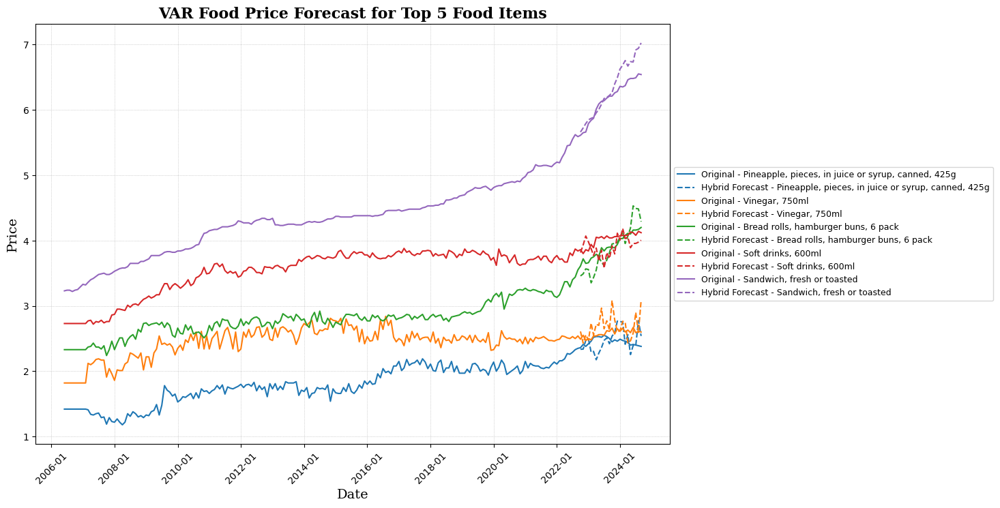

In [14]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
next_top_10_items = best_10_items[5:].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(next_top_10_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(forecast_df.index, forecast_df[item], label=f'Hybrid Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('VAR Food Price Forecast for Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('VAR_forecast_matplotlib_top_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


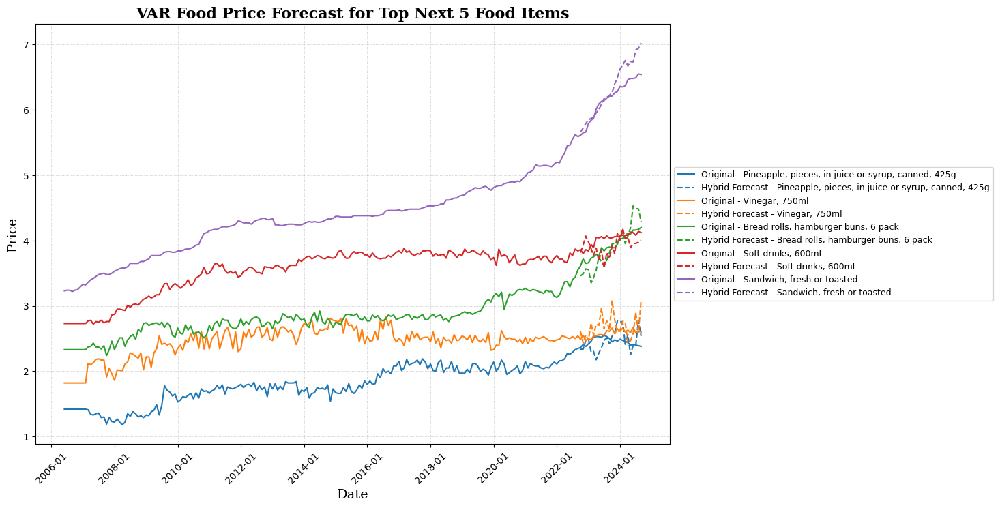

In [15]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
next_top_10_items = best_10_items[5:].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(next_top_10_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(forecast_df.index, forecast_df[item], label=f'Hybrid Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('VAR Food Price Forecast for Top Next 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('VAR_forecast_matplotlib_top_next_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


## Exponential Smoothing 

In [16]:
# Prepare DataFrames to store forecasts and metrics
forecast_start_date = test.index[-1] + pd.DateOffset(months=1)
forecast_dates = pd.date_range(start=forecast_start_date, periods=12, freq='MS')  # 'MS' ensures month start
future_forecast_df = pd.DataFrame(index=forecast_dates, columns=pivot_df.columns)
test_forecast_df = pd.DataFrame(index=test.index, columns=pivot_df.columns)
expsm_metrics = {}

# Fit Exponential Smoothing model for each food item, forecast, and evaluate
for column in pivot_df.columns:
    try:
        # Train the model
        model = ExponentialSmoothing(train[column], seasonal='add', seasonal_periods=12)
        model_fit = model.fit()

        # Forecast for the test period
        test_forecast = model_fit.forecast(steps=len(test))
        expo_smoothing_pred = test_forecast
        test_forecast_df[column] = test_forecast.values

        # Extend the training set to include the test set for future forecasting
        extended_train = pd.concat([train[column], test[column]])
        extended_model = ExponentialSmoothing(extended_train, seasonal='add', seasonal_periods=12)
        extended_model_fit = extended_model.fit()

        # Forecast for the next 12 months (after the test period)
        future_forecast = extended_model_fit.forecast(steps=12)
        future_forecast.index = forecast_dates  # Align the forecast index with future_forecast_df
        future_forecast_df[column] = future_forecast.values

        # Calculate MAE and MSE for the test period
        mae = mean_absolute_error(test[column], test_forecast)
        mse = mean_squared_error(test[column], test_forecast)
        expsm_metrics[column] = {'MAE': mae, 'MSE': mse}

    except Exception as e:
        print(f"Error processing column {column}: {e}")
        expsm_metrics[column] = {'MAE': None, 'MSE': None}

# Convert metrics dictionary to DataFrame
expsm_metrics_df = pd.DataFrame(expsm_metrics).T
expsm_metrics_df['Model'] = 'Exponential Smoothing'

# Rearrange the columns
expsm_metrics_df = expsm_metrics_df[['Model', 'MAE', 'MSE']]

# Combine with existing error metrics DataFrame (assuming var_metrics_df exists)
merged_errors = pd.concat([var_metrics_df, expsm_metrics_df])

print("Merged Error Metrics DataFrame:")
merged_errors

Merged Error Metrics DataFrame:


,Model,MAE,MSE
"Apples, 1kg",VAR,0.712132,0.851149
"Avocado, 1kg",VAR,7.129476,85.961409
"Baby food, 110g",VAR,0.265845,0.097443
"Bananas, 1kg",VAR,0.391675,0.237149
"Beans, 1kg",VAR,9.177280,115.783327
...,...,...,...
"Two minute noodles, multipack,5",Exponential Smoothing,0.315341,0.111407
"Vinegar, 750ml",Exponential Smoothing,0.084757,0.010815
"Wheatmeal bread, sliced, 700g",Exponential Smoothing,0.213579,0.055193
"Wholegrain bread, sliced, 700g",Exponential Smoothing,0.245831,0.076641


## Next Year Forecast

In [17]:
#Exponential Smoothing forecast for next one year
future_forecast_df.to_excel('Exponential_Smoothing_future_forecast_12_months.xlsx')
future_forecast_df

Series_title_1,"Apples, 1kg","Avocado, 1kg","Baby food, 110g","Bananas, 1kg","Beans, 1kg","Beef - mince, 1kg","Beef steak - blade, 1kg","Beef steak - porterhouse/sirloin, 1kg","Biscuits - chocolate, 200g","Biscuits, plain (eg arrowroot, ginger, malt, wine), 250g",...,"Tea bags (supermarket only), box of 100","Tea, takeaway","Tomatoes, 1kg","Tomatoes, canned, 400g","Tuna - canned (supermarket only), 185g","Two minute noodles, multipack,5","Vinegar, 750ml","Wheatmeal bread, sliced, 700g","Wholegrain bread, sliced, 700g","Yoghurt - flavoured, 150g pottle (supermarket only), pk of 6"
2024-10-01,4.221740,5.957063,1.340021,3.655056,18.657093,19.297041,24.535456,36.200452,3.551760,3.028603,...,5.814576,4.170007,10.419232,1.591360,3.347672,3.634927,2.561059,3.431014,4.134834,7.415289
2024-11-01,4.566633,5.780675,1.342130,3.698030,19.287205,19.142875,24.532553,36.258572,3.517426,3.002136,...,5.809797,4.171113,7.185422,1.605080,3.388415,3.656112,2.587369,3.447024,4.123345,7.436090
2024-12-01,4.979851,6.264816,1.337610,3.692719,19.704985,19.059731,24.548597,35.565027,3.549777,2.965635,...,5.797067,4.168889,6.576059,1.594481,3.409158,3.672278,2.514221,3.459172,4.110231,7.479075
2025-01-01,5.494191,6.634948,1.333048,3.704599,16.586125,19.185974,24.670138,36.039820,3.592714,3.028040,...,5.832789,4.167785,6.730058,1.612647,3.356586,3.655117,2.529977,3.480195,4.153176,7.543151
2025-02-01,4.664083,7.119397,1.326823,3.734359,15.761736,19.173915,24.515042,35.435718,3.528979,3.038231,...,5.828493,4.163347,6.681242,1.628739,3.367813,3.634635,2.571279,3.461215,4.138349,7.462211
2025-03-01,3.872307,9.469363,1.332835,3.757900,16.327282,19.143667,24.418260,35.645511,3.566325,3.004525,...,5.841983,4.157788,7.320203,1.601804,3.383063,3.653051,2.557604,3.486585,4.152996,7.482578
2025-04-01,3.789981,10.867685,1.345610,3.677563,17.165741,19.100581,24.120919,35.718626,3.578684,3.033608,...,5.798239,4.170567,8.228651,1.611554,3.357729,3.681990,2.617240,3.472005,4.149275,7.488317
2025-05-01,3.722097,12.725321,1.330040,3.603924,17.921422,19.131306,23.876941,34.923421,3.579405,3.034892,...,5.819487,4.180019,9.090970,1.627028,3.370089,3.658161,2.571883,3.458050,4.157780,7.464252
2025-06-01,3.723060,10.000479,1.323482,3.533896,19.094522,19.211183,23.788740,35.060691,3.512826,3.004300,...,5.806933,4.179467,11.232096,1.620870,3.333953,3.644404,2.632881,3.456087,4.159205,7.391153
2025-07-01,3.815605,7.864923,1.323966,3.532010,20.263510,19.090249,23.901778,35.229440,3.545513,3.001301,...,5.811376,4.179460,11.928510,1.599839,3.347937,3.646555,2.619396,3.483825,4.139387,7.408130


## Plot

In [18]:
# Create Plotly interactive graph
# Get top 10 products based on their average sales
top_products = pivot_df.mean().index

# Create a Plotly figure
fig = go.Figure()

# Add traces for train, test, and forecast data for top products
for column in top_products:
    fig.add_trace(go.Scatter(x=train.index, y=train[column], mode='lines', name=f'Train - {column}', visible=True if column == top_products[0] else False))
    fig.add_trace(go.Scatter(x=test.index, y=test[column], mode='lines', name=f'Test - {column}', visible=True if column == top_products[0] else False))
    fig.add_trace(go.Scatter(x=test_forecast_df.index, y=test_forecast_df[column], mode='lines', name=f'Forecast - {column}', line=dict(dash='dash'), visible=True if column == top_products[0] else False))

# Create dropdown buttons for each product
dropdown_buttons = []

# Add individual product buttons
for column in top_products:
    dropdown_buttons.append(
        dict(
            label=column,
            method='update',
            args=[{'visible': [col == column for col in top_products for _ in range(3)]},  # Show only the selected product
                  {'title': f'Food Price Forecast for {column}'}]
        )
    )

# Add "All" button
dropdown_buttons.insert(0,
    dict(
        label='All',
        method='update',
        args=[{'visible': [True for _ in range(len(top_products) * 3)]},  # Show all products
              {'title': 'Food Price Forecast for All Products'}]
    )
)

# Update layout for better readability
fig.update_layout(
    title=f'Food Price Forecast for {top_products[0]}',
    xaxis_title='Date',
    yaxis_title='Price',
    xaxis=dict(
        tickformat='%Y-%m-%d',
        tickmode='auto',
        nticks=20  # Adjust the number of ticks on the x-axis
    ),
    yaxis=dict(
        title='Price'
    ),
    legend=dict(
        x=0.01,
        y=0.99,
        bordercolor='black',
        borderwidth=1
    ),
    updatemenus=[
        dict(
            active=0,
            buttons=dropdown_buttons,
            direction='down',
            showactive=True,
            x=0.01,
            xanchor='left',
            y=1.15,
            yanchor='top'
        )
    ]
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

# Show the interactive plot
fig.show()

In [19]:
from sklearn.metrics import mean_absolute_error

best_10_items = expsm_metrics_df.sort_values(by='MAE').head(10)

# Get top 5 worst-performing items (highest MAE)
worst_10_items = expsm_metrics_df.sort_values(by='MAE', ascending=False).head(10)

# Display results
print("Top 10 Best-Performing Items:")
print(best_10_items)


Top 10 Best-Performing Items:
                                                                   Model  \
Milk - standard homogenised, 2 litres              Exponential Smoothing   
Bread - white sliced loaf, 600g                    Exponential Smoothing   
Cream, 300ml - Cheapest Available                  Exponential Smoothing   
Vinegar, 750ml                                     Exponential Smoothing   
Milk, calcium enriched, 2 litres                   Exponential Smoothing   
Cookie, takeaway, each                             Exponential Smoothing   
Soup, canned, 500g                                 Exponential Smoothing   
Soy milk, unflavoured, 1 litre                     Exponential Smoothing   
Spaghetti - canned, 420g                           Exponential Smoothing   
Salmon, imported, pink, canned, unflavoured, 210g  Exponential Smoothing   

                                                        MAE       MSE  
Milk - standard homogenised, 2 litres              0.058718  

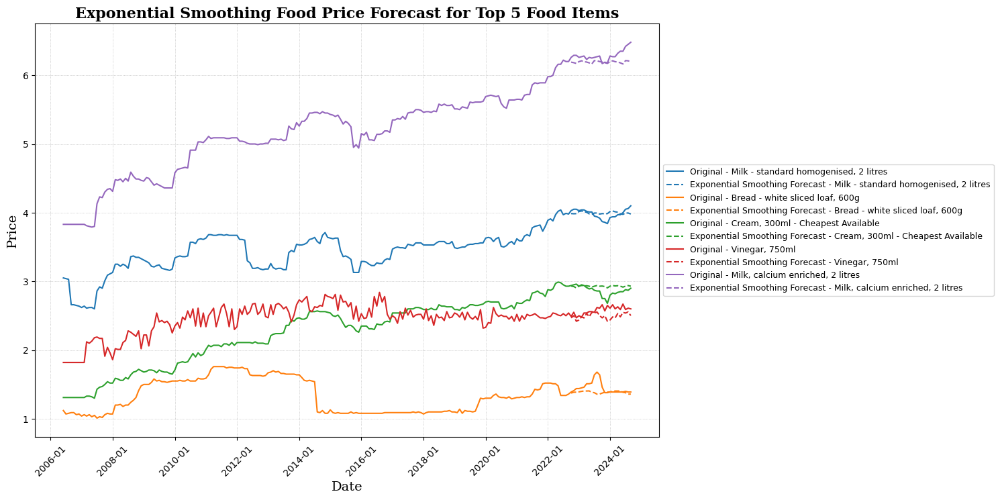

In [20]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
top_10_items = best_10_items[:5].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(top_10_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(test_forecast_df.index, test_forecast_df[item], label=f'Exponential Smoothing Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('Exponential Smoothing Food Price Forecast for Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('ExponentialSmoothing_forecast_matplotlib_top_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


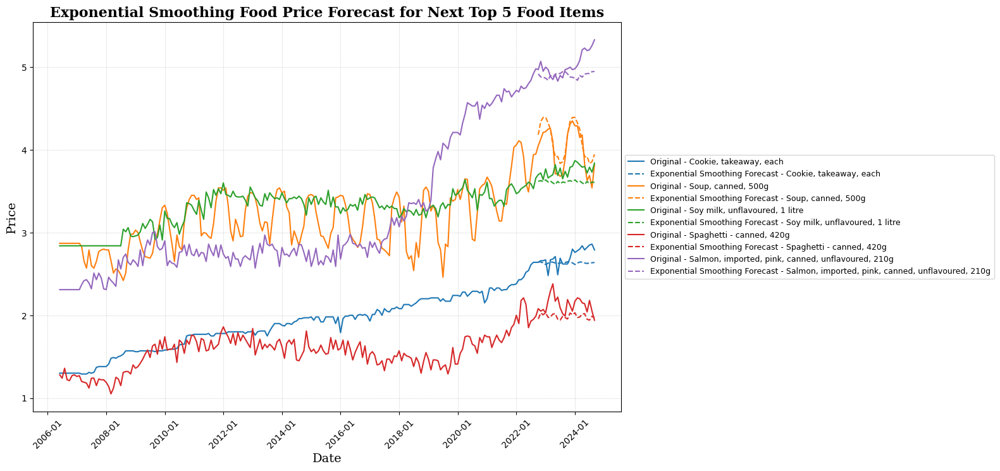

In [21]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
top_10_items = best_10_items[5:].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(top_10_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(test_forecast_df.index, test_forecast_df[item], label=f'Exponential Smoothing Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('Exponential Smoothing Food Price Forecast for Next Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('ExponentialSmoothing_forecast_matplotlib_next_top_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


## LSTM

In [22]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
train_scaled = scaler.fit_transform(train)
test_scaled = scaler.transform(test)

# Convert scaled data back to DataFrame
train_scaled = pd.DataFrame(train_scaled, columns=train.columns, index=train.index)
test_scaled = pd.DataFrame(test_scaled, columns=test.columns, index=test.index)

time_step = 12

# Prepare data for LSTM model without create_dataset function
def prepare_lstm_data(data, time_step):
    X, y = [], []
    for i in range(len(data) - time_step):
        X.append(data[i:i + time_step])
        y.append(data[i + time_step])
    return np.array(X), np.array(y)

X_train, y_train = prepare_lstm_data(train_scaled.values, time_step)
X_test, y_test = prepare_lstm_data(test_scaled.values, time_step)

# Reshape input to be 3D for LSTM [samples, time steps, features]
X_train = X_train.reshape((X_train.shape[0], time_step, train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], time_step, test.shape[1]))

print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

input_shape = (time_step, train.shape[1])
tf.keras.backend.clear_session()

# Define and train the LSTM model
def create_lstm_model(input_shape):
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.LSTM(512, return_sequences=True, input_shape=input_shape))
    model.add(tf.keras.layers.Dropout(0.2))
    model.add(tf.keras.layers.LSTM(256, return_sequences=True))
    model.add(tf.keras.layers.Dropout(0.2))
    model.add(tf.keras.layers.LSTM(128, return_sequences=False))
    model.add(tf.keras.layers.Dropout(0.2))
    model.add(tf.keras.layers.Dense(64, activation='relu'))
    model.add(tf.keras.layers.Dense(train.shape[1]))
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='mean_squared_error')
    return model

# Create and train the model
model = create_lstm_model(input_shape)
model.summary()  # Display the model architecture


# Train the model with early stopping
history = model.fit(X_train, y_train, epochs=100, batch_size=8, validation_data=(X_test, y_test), verbose=1)
# Save the full dataset trained model as .h5 file
model.save('lstm_model_test.h5')
# Make predictions for the test set
test_predict = model.predict(X_test)



# Inverse transform the predictions and actual values
test_predict_original = scaler.inverse_transform(test_predict)
y_test_original = scaler.inverse_transform(y_test)

# Create DataFrame for LSTM forecasted values for the test period
forecast_lstm_df = pd.DataFrame(test_predict_original, index=test.index[time_step:], columns=test.columns)
lstm_pred = forecast_lstm_df

# Calculate error metrics for the test period
lstm_error_metrics = {}
for column in pivot_df.columns:
    mae = mean_absolute_error(y_test_original[:, pivot_df.columns.get_loc(column)], test_predict_original[:, pivot_df.columns.get_loc(column)])
    mse = mean_squared_error(y_test_original[:, pivot_df.columns.get_loc(column)], test_predict_original[:, pivot_df.columns.get_loc(column)])
    lstm_error_metrics[column] = {'MAE': mae, 'MSE': mse}

# Combine error metrics into a single DataFrame
lstm_metrics_df = pd.DataFrame(lstm_error_metrics).T
lstm_metrics_df['Model'] = 'LSTM'

# Rearrange the columns
lstm_metrics_df = lstm_metrics_df[['Model', 'MAE', 'MSE']]

print(lstm_metrics_df)

# Retrain the LSTM model on the entire dataset (train + test)
pivot_scaled = scaler.fit_transform(pivot_df)
X_full, y_full = prepare_lstm_data(pivot_scaled, time_step)

# Reshape input to be 3D for LSTM
X_full = X_full.reshape((X_full.shape[0], time_step, pivot_df.shape[1]))

# Create and train the model on the full dataset
model_full = create_lstm_model(input_shape)
model_full.summary()  # Display the model architecture

# Train the model on the full dataset
history_full = model_full.fit(X_full, y_full, epochs=100, batch_size=8, verbose=1)
model.save('lstm_model_future.h5')

# Forecast the next 12 months after the test period
last_12_steps = pivot_scaled[-time_step:]  # Convert to NumPy array
future_forecast = []

current_step = last_12_steps.reshape((1, time_step, pivot_df.shape[1]))

for i in range(12):
    next_pred = model_full.predict(current_step)
    future_forecast.append(next_pred[0])
    next_pred_scaled = scaler.transform(next_pred)
    current_step = np.append(current_step[:, 1:, :], [next_pred_scaled], axis=1)

future_forecast = scaler.inverse_transform(future_forecast)
forecast_dates = pd.date_range(start=test.index[-1] + pd.DateOffset(1), periods=12, freq='MS')
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=pivot_df.columns)

Shape of X_train: (184, 12, 136)
Shape of y_train: (184, 136)
Shape of X_test: (12, 12, 136)
Shape of y_test: (12, 136)



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 12, 512)             │       1,329,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 12, 512)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 256)             │         787,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 12, 256)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 128)                 │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 136)                 │           8,840 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,330,824 (8.89 MB)

 Trainable params: 2,330,824 (8.89 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.1733 - val_loss: 0.4419
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0447 - val_loss: 0.4095
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0398 - val_loss: 0.3609
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0359 - val_loss: 0.4295
Epoch 5/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319 - val_loss: 0.4116
Epoch 6/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0260 - val_loss: 0.2849
Epoch 7/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0288 - val_loss: 0.3968
Epoch 8/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0325 - val_loss: 0.4202
Epoch 9/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0238 - val_loss: 0.4406
Epoch 10/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0228 - val_loss: 0.3798
Epoch 11/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0251 - val_loss: 0.4213
Epoch 12/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
                                                   Model       MAE        MSE
Apples, 1kg                                         LSTM  1.051579   1.741693
Avocado, 1kg                                        LSTM  3.300085  12.520297
Baby food, 110g                                     LSTM  0.201526   0.040985
Bananas, 1kg                                        LSTM  0.642976   0.416818
Beans, 1kg                                          LSTM  1.870960   5.345006
...                                                  ...       ...        ...
Two minute noodles, multipack,5                     LSTM  1.085198   1.183199
Vinegar, 750ml                                      LSTM  0.121835   0.015852
Wheatmeal bread, sliced, 700g                       LSTM  0.508186   0.258781
Wholegrain bread, sliced, 700g                      LSTM  0.554006   0.308514
Yoghurt - flavoured, 150g pottle (supermarket o...  LSTM  2.006887   4.083582

[136 rows x 3 columns]


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                        │ (None, 12, 512)             │       1,329,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 12, 512)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 12, 256)             │         787,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 12, 256)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 128)                 │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 136)                 │           8,840 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,330,824 (8.89 MB)

 Trainable params: 2,330,824 (8.89 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.1212
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0506
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0380
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0291
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0312
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0465
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0237
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0235
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0233
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0191
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0181
Epoch 12/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0339
Epoch 13/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0204
Epoch 14/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0200
Epoch 15/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - lo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


## Next 12 months forecast 

In [23]:
# future_forecast_df.to_excel('LSTM_future_forecast_12_months.xlsx')
print("Future Forecast DataFrame:")
future_forecast_df

Future Forecast DataFrame:


Series_title_1,"Apples, 1kg","Avocado, 1kg","Baby food, 110g","Bananas, 1kg","Beans, 1kg","Beef - mince, 1kg","Beef steak - blade, 1kg","Beef steak - porterhouse/sirloin, 1kg","Biscuits - chocolate, 200g","Biscuits, plain (eg arrowroot, ginger, malt, wine), 250g",...,"Tea bags (supermarket only), box of 100","Tea, takeaway","Tomatoes, 1kg","Tomatoes, canned, 400g","Tuna - canned (supermarket only), 185g","Two minute noodles, multipack,5","Vinegar, 750ml","Wheatmeal bread, sliced, 700g","Wholegrain bread, sliced, 700g","Yoghurt - flavoured, 150g pottle (supermarket only), pk of 6"
2024-10-01,3.945600,10.826180,1.282299,3.660452,16.371020,18.286097,22.630659,32.756725,3.271050,2.982251,...,5.678222,4.040934,8.685408,1.675905,3.245843,3.605786,2.605105,3.437979,4.006405,7.140434
2024-11-01,3.478678,10.647421,1.162284,3.555878,18.448901,18.243625,22.179888,32.806293,3.003013,2.701935,...,5.386126,3.861900,9.706473,1.597565,3.062659,3.286810,2.541037,3.231963,3.787154,6.400027
2024-12-01,3.342198,10.914155,1.146334,3.353419,17.723044,17.634823,21.486003,32.346161,2.883452,2.549796,...,5.282058,3.764539,9.014277,1.513585,2.992915,3.019244,2.509136,3.130312,3.700988,5.961706
2025-01-01,3.332892,10.765690,1.147807,3.323950,17.581153,17.571896,21.416569,32.280521,2.864645,2.532737,...,5.269500,3.755423,8.917608,1.500991,2.989562,2.974917,2.505238,3.119604,3.693993,5.898231
2025-02-01,3.342952,10.930728,1.147584,3.346961,17.661135,17.600508,21.463746,32.320444,2.882416,2.546944,...,5.282124,3.761903,8.963523,1.511423,2.994025,3.012132,2.508255,3.129194,3.701070,5.951894
2025-03-01,3.352538,10.942109,1.148465,3.360646,17.711676,17.663390,21.530836,32.377144,2.890113,2.557532,...,5.293914,3.772153,9.022414,1.516452,2.999214,3.030490,2.511135,3.135896,3.706669,5.983511
2025-04-01,3.374798,10.817913,1.148776,3.406558,18.070671,17.877926,21.752758,32.563374,2.908889,2.587832,...,5.322918,3.801225,9.281838,1.533844,3.014413,3.090619,2.517702,3.156495,3.723450,6.077393
2025-05-01,3.378507,10.895191,1.149808,3.410065,17.988554,17.875689,21.749097,32.557574,2.914047,2.590922,...,5.325670,3.802360,9.254116,1.534758,3.014292,3.094080,2.519368,3.157659,3.724324,6.086154
2025-06-01,3.317305,11.114111,1.146792,3.335664,17.386180,17.428310,21.258904,32.123519,2.882696,2.524635,...,5.249892,3.730273,8.725354,1.504316,2.974461,2.981599,2.504915,3.113724,3.687444,5.895996
2025-07-01,3.217067,11.179548,1.138557,3.254015,16.919997,16.990015,20.667872,31.642475,2.828617,2.426071,...,5.137423,3.632646,8.129836,1.472882,2.917809,2.823296,2.476013,3.054317,3.642475,5.631530


In [24]:
# Evaluate error metrics
error_metrics = {}
for i, column in enumerate(train.columns):
    mae = mean_absolute_error(y_test_original[:, i], test_predict_original[:, i])
    mse = mean_squared_error(y_test_original[:, i], test_predict_original[:, i])
    error_metrics[column] = {'MAE': mae, 'MSE': mse}

# Convert error metrics to DataFrame
lstm_metrics_df = pd.DataFrame(error_metrics).T
lstm_metrics_df['Model'] = 'LSTM'

# Rearrange the columns
lstm_metrics_df = lstm_metrics_df[['Model', 'MAE', 'MSE']]

# Assuming var_metrics_df and expsm_metrics exist
merged_errors = pd.concat([merged_errors, lstm_metrics_df])

merged_errors

,Model,MAE,MSE
"Apples, 1kg",VAR,0.712132,0.851149
"Avocado, 1kg",VAR,7.129476,85.961409
"Baby food, 110g",VAR,0.265845,0.097443
"Bananas, 1kg",VAR,0.391675,0.237149
"Beans, 1kg",VAR,9.177280,115.783327
...,...,...,...
"Two minute noodles, multipack,5",LSTM,1.085198,1.183199
"Vinegar, 750ml",LSTM,0.121835,0.015852
"Wheatmeal bread, sliced, 700g",LSTM,0.508186,0.258781
"Wholegrain bread, sliced, 700g",LSTM,0.554006,0.308514


## Plot

In [25]:
# Assuming train, test, and forecast_df are defined
# Get top 10 products based on their average sales
top_products = pivot_df.mean().index

# Create a Plotly figure
fig = go.Figure()

# Add traces for train, test, and forecast data for top products
for column in top_products:
    fig.add_trace(go.Scatter(x=train.index, y=train[column], mode='lines', name=f'Train - {column}', visible=True if column == top_products[0] else False))
    fig.add_trace(go.Scatter(x=test.index, y=test[column], mode='lines', name=f'Test - {column}', visible=True if column == top_products[0] else False))
    fig.add_trace(go.Scatter(x=forecast_lstm_df.index, y=forecast_lstm_df[column], mode='lines', name=f'Forecast - {column}', line=dict(dash='dash'), visible=True if column == top_products[0] else False))

# Create dropdown buttons for each product
dropdown_buttons = []

# Add individual product buttons
for column in top_products:
    dropdown_buttons.append(
        dict(
            label=column,
            method='update',
            args=[{'visible': [col == column for col in top_products for _ in range(3)]},  # Show only the selected product
                  {'title': f'Food Price Forecast for {column}'}]
        )
    )

# Add "All" button
dropdown_buttons.insert(0,
    dict(
        label='All',
        method='update',
        args=[{'visible': [True for _ in range(len(top_products) * 3)]},  # Show all products
              {'title': 'Food Price Forecast for All Products'}]
    )
)

# Update layout for better readability
fig.update_layout(
    title=f'Food Price Forecast for {top_products[0]}',
    xaxis_title='Date',
    yaxis_title='Price',
    xaxis=dict(
        tickformat='%Y-%m-%d',
        tickmode='auto',
        nticks=20  # Adjust the number of ticks on the x-axis
    ),
    yaxis=dict(
        title='Price'
    ),
    legend=dict(
        x=0.01,
        y=0.99,
        bordercolor='black',
        borderwidth=1
    ),
    updatemenus=[
        dict(
            active=0,
            buttons=dropdown_buttons,
            direction='down',
            showactive=True,
            x=0.01,
            xanchor='left',
            y=1.15,
            yanchor='top'
        )
    ]
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

# Show the interactive plot
fig.show()

In [26]:
lstm_pred

Series_title_1,"Apples, 1kg","Avocado, 1kg","Baby food, 110g","Bananas, 1kg","Beans, 1kg","Beef - mince, 1kg","Beef steak - blade, 1kg","Beef steak - porterhouse/sirloin, 1kg","Biscuits - chocolate, 200g","Biscuits, plain (eg arrowroot, ginger, malt, wine), 250g",...,"Tea bags (supermarket only), box of 100","Tea, takeaway","Tomatoes, 1kg","Tomatoes, canned, 400g","Tuna - canned (supermarket only), 185g","Two minute noodles, multipack,5","Vinegar, 750ml","Wheatmeal bread, sliced, 700g","Wholegrain bread, sliced, 700g","Yoghurt - flavoured, 150g pottle (supermarket only), pk of 6"
Date,,,,,,,,,,,,,,,,,,,,,
2023-10-01,3.164458,10.407575,1.139054,3.109893,16.708609,16.747023,20.369093,31.503651,2.729210,2.320660,...,5.084018,3.624584,8.786915,1.378672,2.945660,2.635760,2.497625,2.990819,3.563699,5.423952
2023-11-01,3.156388,10.536824,1.139434,3.102312,16.581274,16.700821,20.331245,31.449854,2.728871,2.314149,...,5.081653,3.618710,8.679764,1.372896,2.941820,2.624368,2.497641,2.987359,3.560326,5.403746
2023-12-01,3.158632,10.505727,1.139364,3.104075,16.613161,16.712774,20.341604,31.464901,2.728883,2.315679,...,5.082709,3.620293,8.706692,1.374264,2.943023,2.626897,2.497462,2.988166,3.561252,5.408369
2024-01-01,3.149910,10.629170,1.139548,3.096793,16.490913,16.662519,20.298059,31.405565,2.729004,2.309400,...,5.079400,3.613816,8.604242,1.368776,2.938285,2.616824,2.497742,2.984531,3.557551,5.389719
2024-02-01,3.149640,10.630861,1.139394,3.096367,16.490841,16.655603,20.290895,31.400497,2.729385,2.309120,...,5.079468,3.613043,8.605604,1.368614,2.937612,2.616883,2.497583,2.983886,3.557187,5.389260
2024-03-01,3.120954,11.012738,1.139190,3.073739,16.128645,16.475920,20.129515,31.198559,2.731759,2.289292,...,5.068460,3.590087,8.305190,1.352012,2.920006,2.588543,2.498378,2.970529,3.544213,5.333472
2024-04-01,3.106904,11.199305,1.139043,3.063319,15.961308,16.391159,20.053968,31.104107,2.733033,2.279776,...,5.063513,3.579257,8.164764,1.344307,2.911777,2.575636,2.498737,2.964153,3.538011,5.307567
2024-05-01,3.121652,10.990083,1.139163,3.075106,16.140736,16.480305,20.131203,31.201328,2.732012,2.290534,...,5.067255,3.590432,8.316275,1.352943,2.919829,2.590304,2.498998,2.971180,3.544353,5.336812
2024-06-01,3.114875,11.095648,1.139367,3.069725,16.054329,16.448195,20.106554,31.164671,2.731812,2.285353,...,5.066359,3.586356,8.240450,1.348814,2.917419,2.582570,2.498698,2.968607,3.541955,5.322477


In [27]:
from sklearn.metrics import mean_absolute_error

best_10_items = lstm_metrics_df.sort_values(by='MAE').head(10)

# Get top 5 worst-performing items (highest MAE)
worst_10_items = lstm_metrics_df.sort_values(by='MAE', ascending=False).head(10)

# Display results
print("Top 10 Best-Performing Items:")
print(best_10_items)


Top 10 Best-Performing Items:
                                                   Model       MAE       MSE
Bread - white sliced loaf, 600g                     LSTM  0.068234  0.005142
Cream, 300ml - Cheapest Available                   LSTM  0.089153  0.010128
Vinegar, 750ml                                      LSTM  0.121835  0.015852
Honey, clover, creamed, 500g                        LSTM  0.183202  0.042024
Baby food, 110g                                     LSTM  0.201526  0.040985
Milk - standard homogenised, 2 litres               LSTM  0.255902  0.074411
Peanut butter, not salt free, 375g                  LSTM  0.256129  0.069132
Tomatoes, canned, 400g                              LSTM  0.273898  0.075538
Chocolate novelty bars, 50g                         LSTM  0.273990  0.082041
Pineapple, pieces, in juice or syrup, canned, 425g  LSTM  0.274268  0.076214


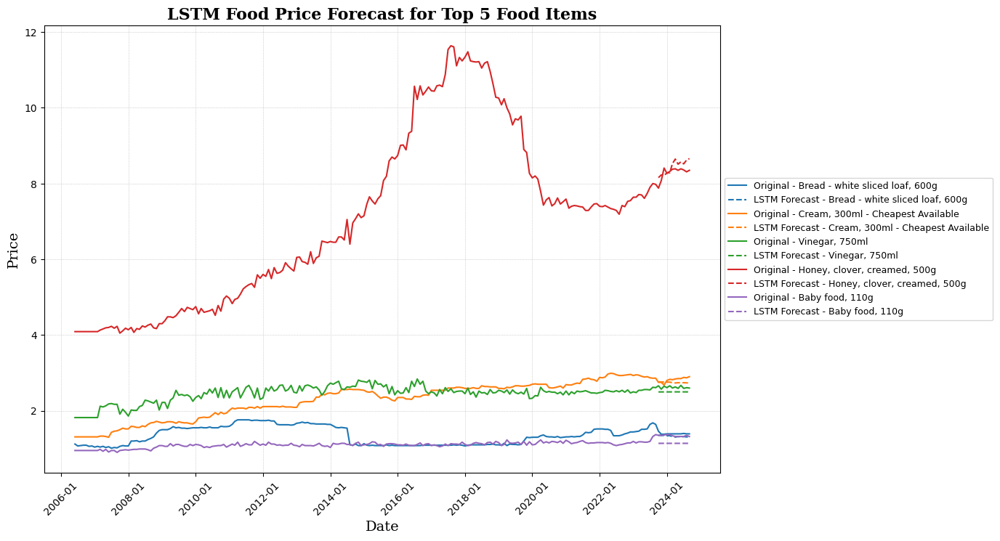

In [28]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
top_10_items = best_10_items[:5].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(top_10_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(lstm_pred.index, lstm_pred[item], label=f'LSTM Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('LSTM Food Price Forecast for Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('LSTM_forecast_matplotlib_top_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


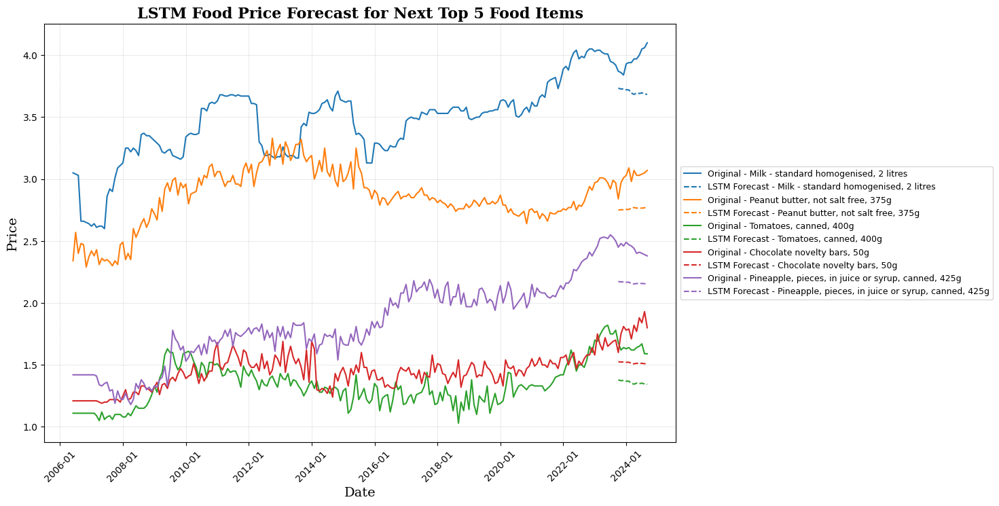

In [29]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
top_10_items = best_10_items[5:].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(top_10_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(lstm_pred.index, lstm_pred[item], label=f'LSTM Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('LSTM Food Price Forecast for Next Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('LSTM_forecast_matplotlib_next_top_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


## SARIMAX

In [30]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Prepare DataFrames to store forecasts and metrics
forecast_df = pd.DataFrame(index=test.index, columns=pivot_df.columns)
future_forecast_df = pd.DataFrame(index=pd.date_range(start=test.index[-1] + pd.DateOffset(1), periods=12, freq='MS'), columns=pivot_df.columns)
arima_metrics = {}

# Loop through each food item
for column in pivot_df.columns:
    try:
        # Optional: Apply log transformation for variance stabilization (handle spikes better)
        train_series = np.log1p(train[column])  # log(1 + x) avoids log(0)
        test_series = np.log1p(test[column])

        # Fit SARIMA model (adds seasonal order to help detect patterns & spikes)
        model = SARIMAX(train_series, order=(1,1,1), seasonal_order=(1,1,1,12), enforce_stationarity=False, enforce_invertibility=False)
        model_fit = model.fit(disp=False)
        
        # Forecast for the test period
        test_forecast_log = model_fit.forecast(steps=len(test))
        test_forecast = np.expm1(test_forecast_log)  # Inverse of log1p

        # Save to forecast_df
        forecast_df[column] = test_forecast
        
        # Calculate metrics
        mae = mean_absolute_error(test[column], test_forecast)
        mse = mean_squared_error(test[column], test_forecast)
        arima_metrics[column] = {'MAE': mae, 'MSE': mse}
        
        # Refit using full data
        full_series = np.log1p(pivot_df[column])
        model_full = SARIMAX(full_series, order=(1,1,1), seasonal_order=(1,1,1,12), enforce_stationarity=False, enforce_invertibility=False)
        model_full_fit = model_full.fit(disp=False)

        # Forecast future 12 months
        future_forecast_log = model_full_fit.forecast(steps=12)
        future_forecast = np.expm1(future_forecast_log)  # Inverse transform
        future_forecast_df[column] = future_forecast

    except Exception as e:
        print(f"Model failed for {column}: {e}")
        forecast_df[column] = np.nan
        future_forecast_df[column] = np.nan
        arima_metrics[column] = {'MAE': np.nan, 'MSE': np.nan}



In [31]:
# Convert metrics dictionary to DataFrame
arima_metrics_df = pd.DataFrame(arima_metrics).T
arima_metrics_df['Model'] = 'SARIMAX'

# Rearrange columns
arima_metrics_df = arima_metrics_df[['Model', 'MAE', 'MSE']]

# Combine with existing metrics
merged_errors = pd.concat([merged_errors, arima_metrics_df])

# Output test forecasts
print("Improved Forecast DataFrame:")
print(forecast_df.head())


Improved Forecast DataFrame:
Series_title_1  Apples, 1kg  Avocado, 1kg  Baby food, 110g  Bananas, 1kg  \
Date                                                                       
2022-10-01         3.370941      6.564690         1.123831      3.410447   
2022-11-01         3.714347      6.231435         1.120355      3.459277   
2022-12-01         4.089839      6.234950         1.125188      3.445164   
2023-01-01         4.763588      6.572061         1.116092      3.481724   
2023-02-01         3.789911      6.946979         1.108159      3.515852   

Series_title_1  Beans, 1kg  Beef - mince, 1kg  Beef steak - blade, 1kg  \
Date                                                                     
2022-10-01       18.761906          18.408225                22.491123   
2022-11-01       19.665624          18.292931                22.526130   
2022-12-01       20.322448          18.363786                22.778822   
2023-01-01       16.135313          18.790312                22.9636

In [32]:
# # Prepare DataFrames to store forecasts and metrics
# forecast_df = pd.DataFrame(index=test.index, columns=pivot_df.columns)
# future_forecast_df = pd.DataFrame(index=pd.date_range(start=test.index[-1] + pd.DateOffset(1), periods=12, freq='MS'), columns=pivot_df.columns)
# arima_metrics = {}

# # Fit ARIMA model for each food item, forecast, and evaluate
# for column in pivot_df.columns:
#     # Fit ARIMA model on training data
#     model = ARIMA(train[column], order=(1,1,1))  # Adjust the order (p,d,q) as necessary
#     model_fit = model.fit()
    
#     # Forecast for the test period
#     test_forecast = model_fit.forecast(steps=len(test))
#     forecast_df[column] = test_forecast
#     arima_pred = test_forecast

#     # Calculate MAE and MSE for the test period
#     mae = mean_absolute_error(test[column], test_forecast)
#     mse = mean_squared_error(test[column], test_forecast)
#     arima_metrics[column] = {'MAE': mae, 'MSE': mse}
    
#     # Extend model using the entire dataset
#     model_full = ARIMA(pivot_df[column], order=(1,1,1))  # Adjust the order (p,d,q) as necessary
#     model_full_fit = model_full.fit()
    
#     # Forecast for the next 12 months after the test period
#     future_forecast = model_full_fit.forecast(steps=12)
#     future_forecast_df[column] = future_forecast

# # Convert metrics dictionary to DataFrame
# arima_metrics_df = pd.DataFrame(arima_metrics).T
# arima_metrics_df['Model'] = 'ARIMA'

# # Rearrange the columns
# arima_metrics_df = arima_metrics_df[['Model', 'MAE', 'MSE']]

# # Combine with existing error metrics DataFrame
# merged_errors = pd.concat([merged_errors, arima_metrics_df])

# # Display the forecast and metrics DataFrames
# print("Test Forecast DataFrame:")
# forecast_df

## Next 12 months Forecast

In [33]:
future_forecast_df.to_excel('Arima_future_forecast_12_months.xlsx')
print("Future Forecast DataFrame:")
future_forecast_df

Future Forecast DataFrame:


Series_title_1,"Apples, 1kg","Avocado, 1kg","Baby food, 110g","Bananas, 1kg","Beans, 1kg","Beef - mince, 1kg","Beef steak - blade, 1kg","Beef steak - porterhouse/sirloin, 1kg","Biscuits - chocolate, 200g","Biscuits, plain (eg arrowroot, ginger, malt, wine), 250g",...,"Tea bags (supermarket only), box of 100","Tea, takeaway","Tomatoes, 1kg","Tomatoes, canned, 400g","Tuna - canned (supermarket only), 185g","Two minute noodles, multipack,5","Vinegar, 750ml","Wheatmeal bread, sliced, 700g","Wholegrain bread, sliced, 700g","Yoghurt - flavoured, 150g pottle (supermarket only), pk of 6"
2024-10-01,4.229087,5.919079,1.345201,3.681523,18.654419,19.334739,24.800953,36.043201,3.539971,3.047060,...,5.861088,4.179743,10.295842,1.600392,3.360866,3.653746,2.562370,3.434622,4.149925,7.401952
2024-11-01,4.656349,5.766765,1.349322,3.750553,19.347838,19.291660,24.737503,35.613138,3.529504,3.015438,...,5.853159,4.195272,5.888927,1.621328,3.424915,3.726834,2.592880,3.462181,4.161759,7.498901
2024-12-01,4.961494,6.657833,1.349225,3.761973,19.891668,19.224535,24.791765,34.598164,3.570543,3.017354,...,5.903071,4.225672,5.341844,1.610780,3.463692,3.749815,2.524551,3.482929,4.152505,7.657954
2025-01-01,5.705868,7.245058,1.346398,3.795195,15.708860,19.683314,25.203743,35.186669,3.632408,3.158159,...,5.931216,4.230166,5.533281,1.634769,3.425793,3.768670,2.544837,3.513346,4.187566,7.790728
2025-02-01,4.860807,7.716650,1.339390,3.837210,14.657032,19.530229,24.987977,34.509846,3.549523,3.163559,...,5.947315,4.233160,5.213539,1.657803,3.430672,3.702682,2.585565,3.498099,4.188099,7.581158
2025-03-01,4.014883,9.448097,1.346947,3.879417,15.416864,19.506813,25.051324,34.796405,3.605124,3.146673,...,5.952419,4.243381,6.155405,1.628271,3.459112,3.757406,2.560442,3.522882,4.184818,7.782152
2025-04-01,3.996712,11.133154,1.363780,3.795469,16.632195,19.706292,24.510916,34.993662,3.614283,3.250207,...,5.929761,4.279096,7.383271,1.644806,3.446829,3.847669,2.624151,3.515807,4.213952,7.695104
2025-05-01,3.905509,13.532014,1.348297,3.710487,17.640463,19.739377,24.484629,34.112679,3.651230,3.204202,...,5.943175,4.320615,8.113903,1.662641,3.427469,3.819129,2.580220,3.509150,4.213861,7.793735
2025-06-01,3.736037,10.685518,1.343414,3.640994,19.244663,19.743236,24.583435,34.387405,3.557925,3.179957,...,5.932295,4.332472,11.122397,1.661599,3.425584,3.797019,2.643569,3.518174,4.212755,7.695574
2025-07-01,3.684187,7.819065,1.345101,3.654561,20.498990,19.796032,24.720842,34.696027,3.609376,3.174217,...,5.957944,4.341529,12.406316,1.637396,3.456199,3.834011,2.627382,3.557117,4.248814,7.702509


In [34]:
print("Merged Errors DataFrame:")
merged_errors

Merged Errors DataFrame:


,Model,MAE,MSE
"Apples, 1kg",VAR,0.712132,0.851149
"Avocado, 1kg",VAR,7.129476,85.961409
"Baby food, 110g",VAR,0.265845,0.097443
"Bananas, 1kg",VAR,0.391675,0.237149
"Beans, 1kg",VAR,9.177280,115.783327
...,...,...,...
"Two minute noodles, multipack,5",SARIMAX,0.114553,0.019735
"Vinegar, 750ml",SARIMAX,0.064670,0.006987
"Wheatmeal bread, sliced, 700g",SARIMAX,0.127220,0.020996
"Wholegrain bread, sliced, 700g",SARIMAX,0.198288,0.050488


## Plot

In [35]:
# Visualization using Plotly

# Get top 10 products based on their average sales
top_products = pivot_df.mean().index

# Create a Plotly figure
fig = go.Figure()

# Add traces for train, test, and forecast data for top products
for column in top_products:
    fig.add_trace(go.Scatter(x=train.index, y=train[column], mode='lines', name=f'Train - {column}', visible=True if column == top_products[0] else False))
    fig.add_trace(go.Scatter(x=test.index, y=test[column], mode='lines', name=f'Test - {column}', visible=True if column == top_products[0] else False))
    fig.add_trace(go.Scatter(x=forecast_df.index, y=forecast_df[column], mode='lines', name=f'Forecast - {column}', line=dict(dash='dash'), visible=True if column == top_products[0] else False))

# Create dropdown buttons for each product
dropdown_buttons = []

# Add individual product buttons
for column in top_products:
    dropdown_buttons.append(
        dict(
            label=column,
            method='update',
            args=[{'visible': [col == column for col in top_products for _ in range(3)]},  # Show only the selected product
                  {'title': f'Food Price Forecast for {column}'}]
        )
    )

# Add "All" button
dropdown_buttons.insert(0,
    dict(
        label='All',
        method='update',
        args=[{'visible': [True for _ in range(len(top_products) * 3)]},  # Show all products
              {'title': 'Food Price Forecast for All Products'}]
    )
)

# Update layout for better readability
fig.update_layout(
    title=f'Food Price Forecast for {top_products[0]}',
    xaxis_title='Date',
    yaxis_title='Price',
    xaxis=dict(
        tickformat='%Y-%m-%d',
        tickmode='auto',
        nticks=20  # Adjust the number of ticks on the x-axis
    ),
    yaxis=dict(
        title='Price'
    ),
    legend=dict(
        x=0.01,
        y=0.99,
        bordercolor='black',
        borderwidth=1
    ),
    updatemenus=[
        dict(
            active=0,
            buttons=dropdown_buttons,
            direction='down',
            showactive=True,
            x=0.01,
            xanchor='left',
            y=1.15,
            yanchor='top'
        )
    ]
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

# Show the interactive plot
fig.show()

In [36]:
from sklearn.metrics import mean_absolute_error

best_10_items = arima_metrics_df.sort_values(by='MAE').head(10)

# Get top 5 worst-performing items (highest MAE)
worst_10_items = arima_metrics_df.sort_values(by='MAE', ascending=False).head(10)

# Display results
print("Top 10 Best-Performing Items:")
print(best_10_items)


Top 10 Best-Performing Items:
                                                      Model       MAE  \
Ice block, water based, each                        SARIMAX  0.047046   
Cookie, takeaway, each                              SARIMAX  0.050897   
Chewing gum, packet, each                           SARIMAX  0.056630   
Vinegar, 750ml                                      SARIMAX  0.064670   
Bread - white sliced loaf, 600g                     SARIMAX  0.075616   
Pasta sauces, tomato based, 500g                    SARIMAX  0.082419   
Pineapple, pieces, in juice or syrup, canned, 425g  SARIMAX  0.089302   
Spaghetti - canned, 420g                            SARIMAX  0.095493   
Soy milk, unflavoured, 1 litre                      SARIMAX  0.098610   
Rice - long grain, white (supermarket only), 1kg    SARIMAX  0.102425   

                                                         MSE  
Ice block, water based, each                        0.003486  
Cookie, takeaway, each                  

In [37]:
# import plotly.io as pio
# html_file = 'ARIMA_plotly_graph.html'
# pio.write_html(fig, file=html_file, auto_open=True)

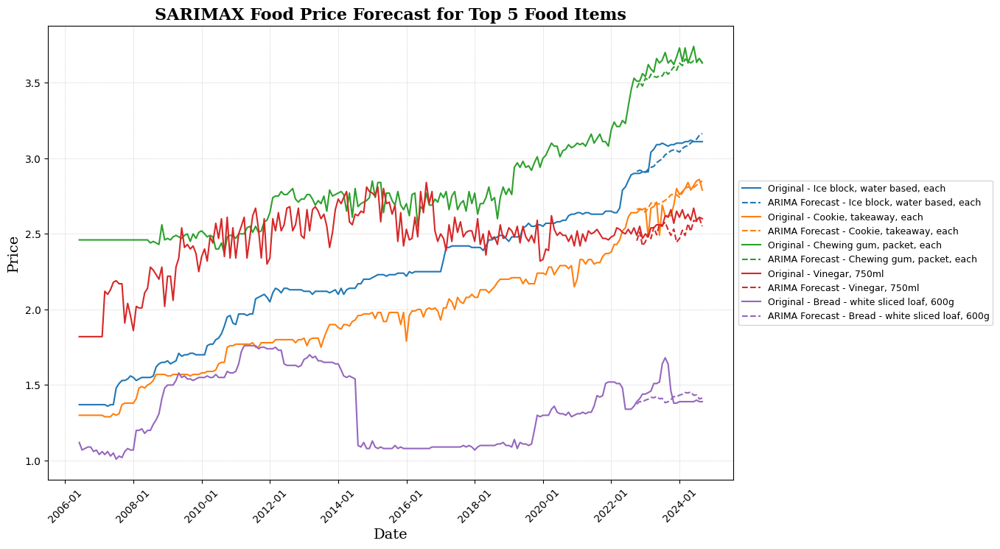

In [38]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
top_10_items = best_10_items[:5].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(top_10_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(forecast_df.index, forecast_df[item], label=f'ARIMA Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('SARIMAX Food Price Forecast for Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('SARIMAX_forecast_matplotlib_top_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


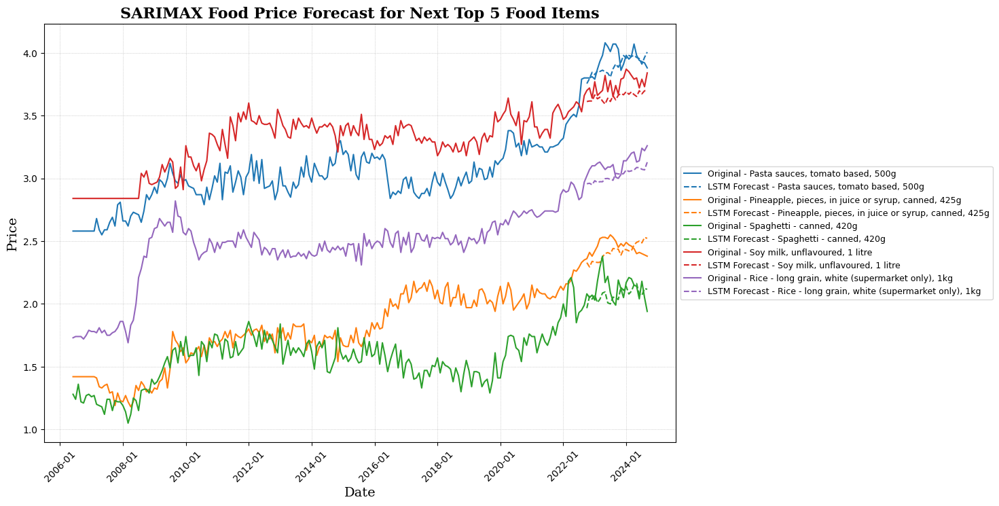

In [39]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
top_10_items = best_10_items[5:].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(top_10_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(forecast_df.index, forecast_df[item], label=f'LSTM Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('SARIMAX Food Price Forecast for Next Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('SARIMAX_forecast_matplotlib_next_top_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


## Models Comparative Analysis (Lower is better)

In [40]:
# grouped_results = grouped_results.drop('SARIMA')
merged_errors

,Model,MAE,MSE
"Apples, 1kg",VAR,0.712132,0.851149
"Avocado, 1kg",VAR,7.129476,85.961409
"Baby food, 110g",VAR,0.265845,0.097443
"Bananas, 1kg",VAR,0.391675,0.237149
"Beans, 1kg",VAR,9.177280,115.783327
...,...,...,...
"Two minute noodles, multipack,5",SARIMAX,0.114553,0.019735
"Vinegar, 750ml",SARIMAX,0.064670,0.006987
"Wheatmeal bread, sliced, 700g",SARIMAX,0.127220,0.020996
"Wholegrain bread, sliced, 700g",SARIMAX,0.198288,0.050488


<Figure size 1000x600 with 0 Axes>

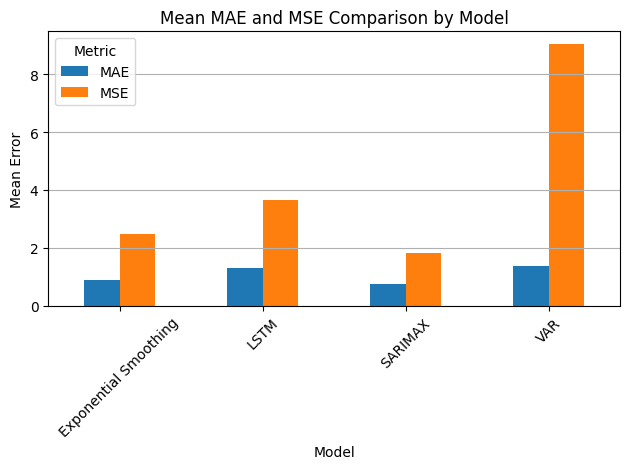

In [41]:
# Assuming you have the dataset loaded into a DataFrame named 'results_df'

# Group the results by Model
grouped_results = merged_errors.groupby('Model').mean()

# Plot the mean MAE and MSE for each model
plt.figure(figsize=(10, 6))
grouped_results[['MAE', 'MSE']].plot(kind='bar', rot=45)
plt.title('Mean MAE and MSE Comparison by Model')
plt.xlabel('Model')
plt.ylabel('Mean Error')
plt.xticks(rotation=45)
plt.legend(title='Metric')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [42]:
grouped_results

,MAE,MSE
Model,,
Exponential Smoothing,0.870939,2.468444
LSTM,1.311827,3.641525
SARIMAX,0.733703,1.800294
VAR,1.353037,9.032677


In [43]:
grouped_results.to_csv('non_hybrid_errors.csv')
grouped_results

,MAE,MSE
Model,,
Exponential Smoothing,0.870939,2.468444
LSTM,1.311827,3.641525
SARIMAX,0.733703,1.800294
VAR,1.353037,9.032677


In [44]:
# Rank each model (lower MAE/MSE = better rank)
grouped_results['MAE_Rank'] = grouped_results['MAE'].rank()
grouped_results['MSE_Rank'] = grouped_results['MSE'].rank()

# Calculate average rank
grouped_results['Avg_Rank'] = grouped_results[['MAE_Rank', 'MSE_Rank']].mean(axis=1)

# Sort by average rank to find best models
best_two_models = grouped_results.sort_values(by='Avg_Rank').head(2)

# Display results
print("Top 2 Performing Models:")
print(best_two_models)

Top 2 Performing Models:
                            MAE       MSE  MAE_Rank  MSE_Rank  Avg_Rank
Model                                                                  
SARIMAX                0.733703  1.800294       1.0       1.0       1.0
Exponential Smoothing  0.870939  2.468444       2.0       2.0       2.0


In [47]:
from PIL import Image

# Load the uploaded image
input_image_path = r"C:\Users\99416\Downloads\Flowchart - Frame 1 (1).jpg"
output_image_path = r"C:\Users\99416\Downloads\Flowchart - high_quality_high_level_architecture.png"

# Open the image
img = Image.open(input_image_path)

# Increase DPI and save
dpi = (600, 600)  # Set high DPI
img.save(output_image_path, dpi=dpi)

output_image_path


'C:\\Users\\99416\\Downloads\\Flowchart - high_quality_high_level_architecture.png'

In [3]:
#Transfer Learning Approach


# ---------------------------
# GLOBAL PRETRAINING STAGE
# ---------------------------

# Reuse your scaler data
pivot_scaled = scaler.fit_transform(pivot_df)
pivot_scaled = pd.DataFrame(pivot_scaled, index=pivot_df.index, columns=pivot_df.columns)

# Prepare global dataset
X_full, y_full = prepare_lstm_data(pivot_scaled.values, time_step)
X_full = X_full.reshape((X_full.shape[0], time_step, pivot_df.shape[1]))

# Pretrained GLOBAL LSTM Encoder
def create_global_encoder(input_shape):
    model = tf.keras.models.Sequential([
        tf.keras.layers.LSTM(256, return_sequences=True, input_shape=input_shape, name="encoder_lstm1"),
        tf.keras.layers.Dropout(0.15),
        tf.keras.layers.LSTM(128, return_sequences=False, name="encoder_lstm2"),
        tf.keras.layers.Dropout(0.15),
        tf.keras.layers.Dense(64, activation='relu', name="encoder_dense")
    ])
    return model

global_encoder = create_global_encoder((time_step, pivot_df.shape[1]))

# Attach small head for pretraining
full_model = tf.keras.models.Sequential([
    global_encoder,
    tf.keras.layers.Dense(pivot_df.shape[1])
])

full_model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss="mse")

print(full_model.summary())

# Train global model
history_global = full_model.fit(
    X_full, y_full,
    epochs=50,
    batch_size=8,
    verbose=1
)

# Save encoder for transfer
global_encoder.save("global_temporal_encoder.h5")


NameError: name 'scaler' is not defined